## Import libraries

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [34]:
from pandas_profiling import ProfileReport
from xgboost import XGBClassifier
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.tree import export_graphviz
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn import model_selection
from sklearn.neural_network import MLPClassifier
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Sequential

## Load data into python

In [3]:
default = pd.read_csv('UCI_Credit_Card.csv')

In [4]:
default.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


## Data exploration

In [5]:
default.shape

(30000, 25)

In [10]:
default.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [6]:
default.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [8]:
default.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,30000.0,15000.500000,8660.398374,1.0,7500.75,15000.5,22500.25,30000.0
LIMIT_BAL,30000.0,167484.322667,129747.661567,10000.0,50000.00,140000.0,240000.00,1000000.0
SEX,30000.0,1.603733,0.489129,1.0,1.00,2.0,2.00,2.0
EDUCATION,30000.0,1.853133,0.790349,0.0,1.00,2.0,2.00,6.0
MARRIAGE,30000.0,1.551867,0.521970,0.0,1.00,2.0,2.00,3.0
AGE,30000.0,35.485500,9.217904,21.0,28.00,34.0,41.00,79.0
PAY_0,30000.0,-0.016700,1.123802,-2.0,-1.00,0.0,0.00,8.0
PAY_2,30000.0,-0.133767,1.197186,-2.0,-1.00,0.0,0.00,8.0
PAY_3,30000.0,-0.166200,1.196868,-2.0,-1.00,0.0,0.00,8.0
PAY_4,30000.0,-0.220667,1.169139,-2.0,-1.00,0.0,0.00,8.0


In [11]:
default.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [12]:
default.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [13]:
default.corr().style.background_gradient(cmap='coolwarm', axis=None)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
ID,1.000000,0.026179,0.018497,0.039177,-0.029079,0.018678,-0.030575,-0.011215,-0.018494,-0.002735,-0.022199,-0.020270,0.019389,0.017982,0.024354,0.040351,0.016705,0.016730,0.009742,0.008406,0.039151,0.007793,0.000652,0.003000,-0.013952
LIMIT_BAL,0.026179,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,-0.235195,0.285430,0.278314,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595,-0.153520
SEX,0.018497,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,-0.044008,-0.033642,-0.031183,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766,-0.039961
EDUCATION,0.039177,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,0.082316,0.023581,0.018749,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200,0.028006
MARRIAGE,-0.029079,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,0.034345,-0.023472,-0.021602,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641,-0.024339
AGE,0.018678,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,-0.048773,0.056239,0.054283,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478,0.013890
PAY_0,-0.030575,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,0.474553,0.187068,0.189859,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673,0.324794
PAY_2,-0.011215,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,0.575501,0.234887,0.235257,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500,0.263551
PAY_3,-0.018494,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,0.632684,0.208473,0.237295,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861,0.235253
PAY_4,-0.002735,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,0.716449,0.202812,0.225816,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565,0.216614


## EDA

Default Rate

In [14]:
default['default.payment.next.month'].value_counts()[1]/len(default)*100

22.12

In [15]:
default.groupby('default.payment.next.month').agg('mean')

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
default.payment.next.month,,,,,,,,,,,,,,,,,,,,,
0,15064.893982,178099.726074,1.614150,1.841337,1.558637,35.417266,-0.211222,-0.301917,-0.316256,-0.355633,...,47533.365605,43611.165254,40530.445343,39042.268704,6307.337357,6640.465074,5753.496833,5300.529319,5248.220296,5719.371769
1,14773.781947,130109.656420,1.567058,1.894665,1.528029,35.725738,0.668174,0.458258,0.362116,0.254521,...,45181.598855,42036.950573,39540.190476,38271.435503,3397.044153,3388.649638,3367.351567,3155.626733,3219.139542,3441.482068


In [19]:
default['default.payment.next.month'].value_counts()

0    23364
1     6636
Name: default.payment.next.month, dtype: int64

### Number of Customers by Default

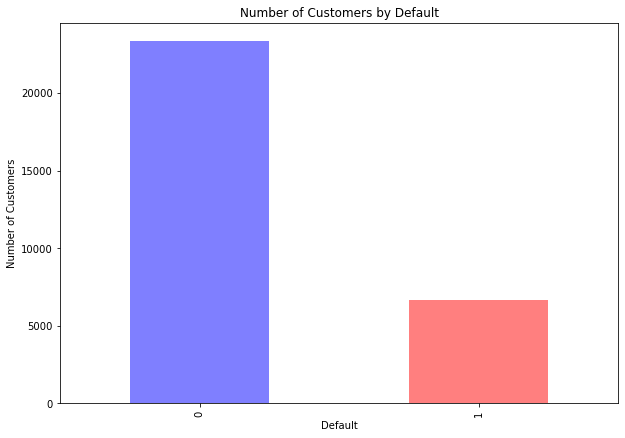

In [18]:
default['default.payment.next.month'].value_counts().plot(kind='bar', figsize = (10,7), color = ['blue','red'], alpha = 0.5, legend = False)
plt.title('Number of Customers by Default')
plt.xlabel('Default')
plt.ylabel('Number of Customers');

### Number of Customers by Sex

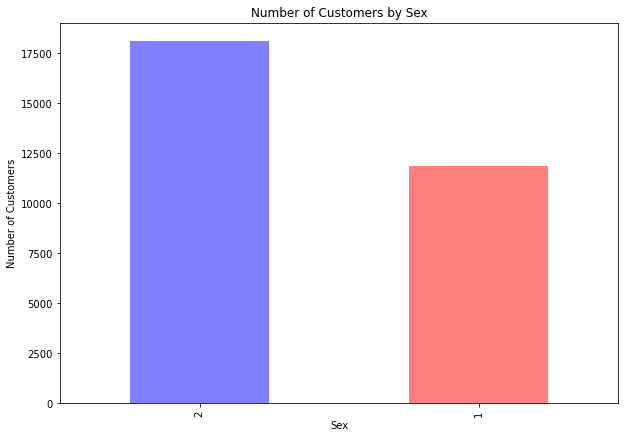

In [21]:
default['SEX'].value_counts().plot(kind='bar', figsize = (10,7), color = ['blue','red'], alpha = 0.5, legend = False)
plt.title('Number of Customers by Sex')
plt.xlabel('Sex')
plt.ylabel('Number of Customers');

### Number of Customers by EDUCATION

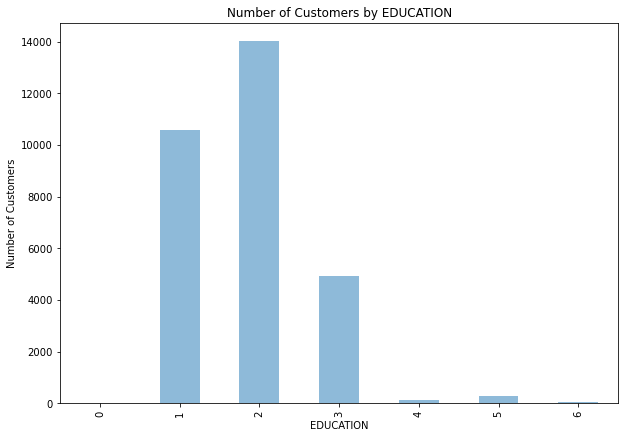

In [25]:
default['EDUCATION'].value_counts().sort_index().plot(kind='bar', figsize = (10,7), alpha = 0.5, legend = False)
plt.title('Number of Customers by EDUCATION')
plt.xlabel('EDUCATION')
plt.ylabel('Number of Customers');

### Number of Customers by MARRIAGE

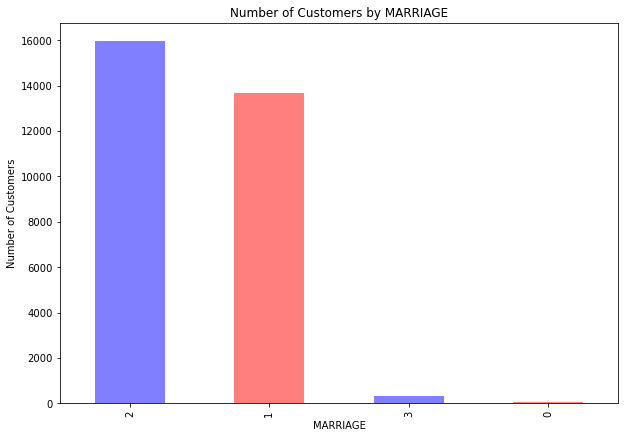

In [29]:
default['MARRIAGE'].value_counts().plot(kind='bar', figsize = (10,7), color = ['blue','red'], alpha = 0.5, legend = False)
plt.title('Number of Customers by MARRIAGE')
plt.xlabel('MARRIAGE')
plt.ylabel('Number of Customers');

### Number of Customers by AGE

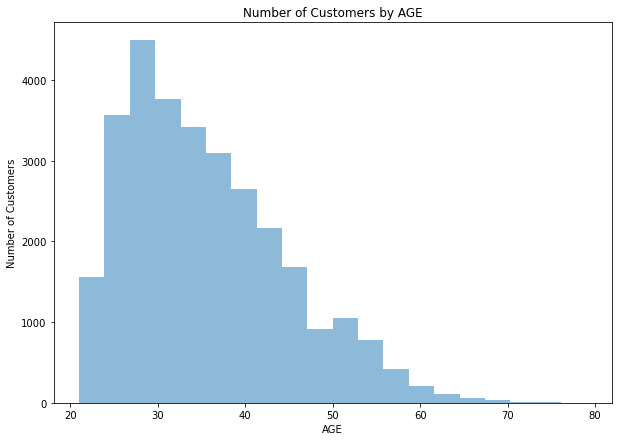

In [28]:
plt.figure(figsize=(10,7))
plt.hist(x = default.AGE, bins = 20, alpha = 0.5)
plt.title('Number of Customers by AGE')
plt.xlabel('AGE')
plt.ylabel('Number of Customers')
plt.show()

### Number of Customers by LIMIT_BAL

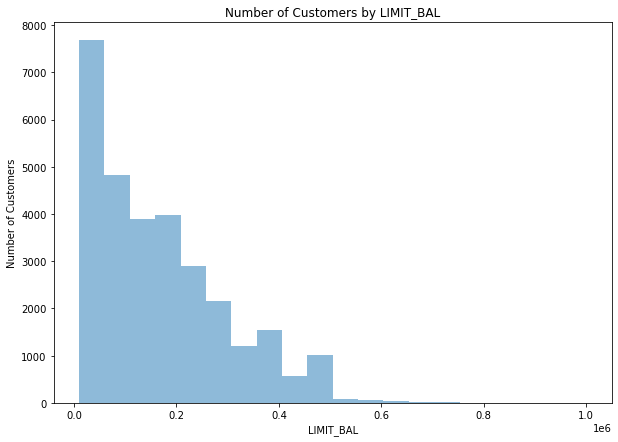

In [30]:
plt.figure(figsize=(10,7))
plt.hist(x = default.LIMIT_BAL, bins = 20, alpha = 0.5)
plt.title('Number of Customers by LIMIT_BAL')
plt.xlabel('LIMIT_BAL')
plt.ylabel('Number of Customers')
plt.show()

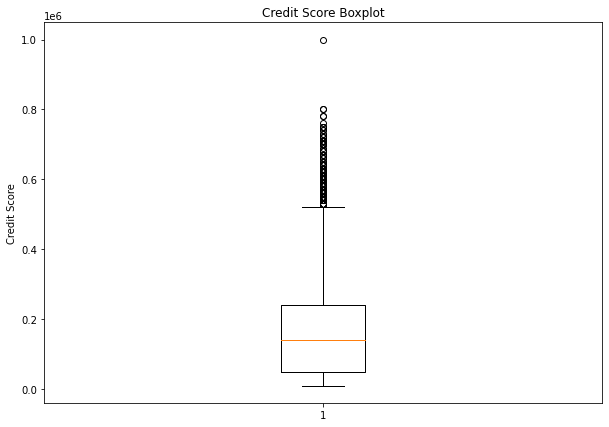

In [31]:
plt.figure(figsize = (10,7));
plt.boxplot(x = default.LIMIT_BAL)
plt.title('Credit Score Boxplot')
plt.ylabel('Credit Score')
plt.show();

### Number of Customers Exited by Sex

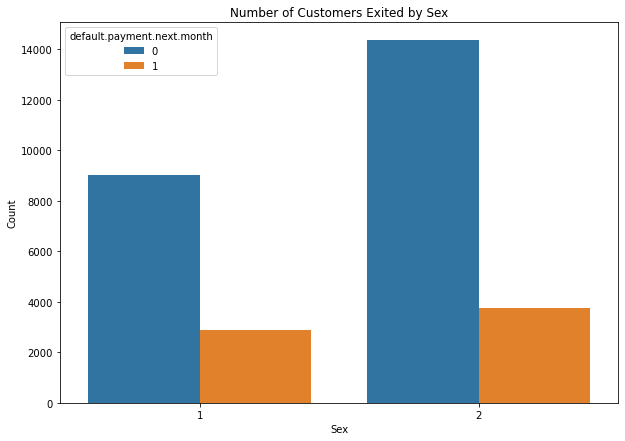

In [36]:
plt.figure(figsize=(10,7))
ax = sns.countplot(x="SEX", hue="default.payment.next.month", data=default)
ax.set_xlabel("Sex")  
ax.set_ylabel("Count")
ax.set_title('Number of Customers Exited by Sex')
plt.show()

### Number of Customers Exited by EDUCATION

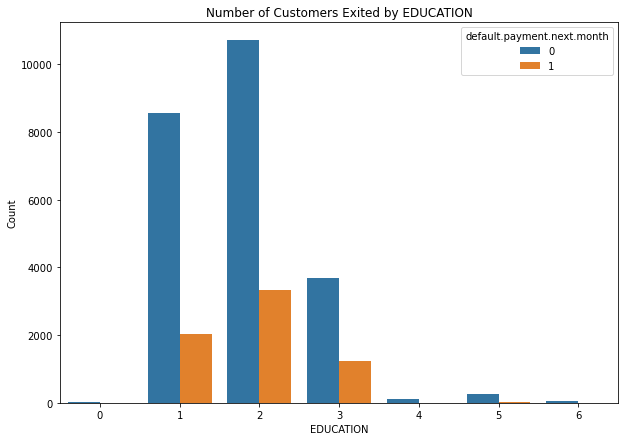

In [37]:
plt.figure(figsize=(10,7))
ax = sns.countplot(x="EDUCATION", hue="default.payment.next.month", data=default)
ax.set_xlabel("EDUCATION")  
ax.set_ylabel("Count")
ax.set_title('Number of Customers Exited by EDUCATION')
plt.show()

### Number of Customers Exited by MARRIAGE

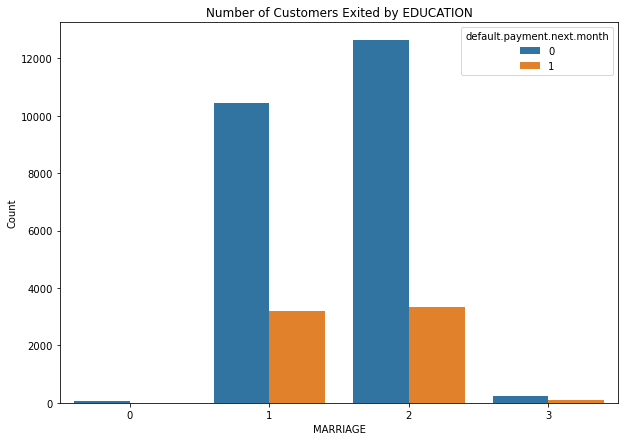

In [38]:
plt.figure(figsize=(10,7))
ax = sns.countplot(x="MARRIAGE", hue="default.payment.next.month", data=default)
ax.set_xlabel("MARRIAGE")  
ax.set_ylabel("Count")
ax.set_title('Number of Customers Exited by MARRIAGE')
plt.show()

### Default Rate by AGE

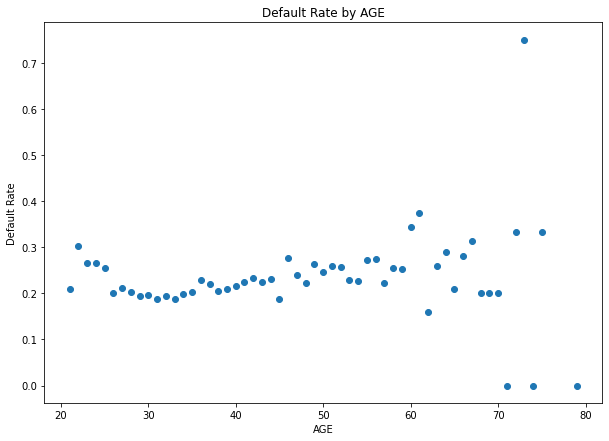

In [39]:
AGE_Exite_rate = default.groupby(default['AGE'])['default.payment.next.month'].mean()
plt.figure(figsize = (10,7))
plt.scatter(x=AGE_Exite_rate.index , y= AGE_Exite_rate.values,marker = 'o',)
plt.title('Default Rate by AGE')
plt.xlabel('AGE')
plt.ylabel('Default Rate')
plt.show();

### Default Rate by LIMIT_BAL

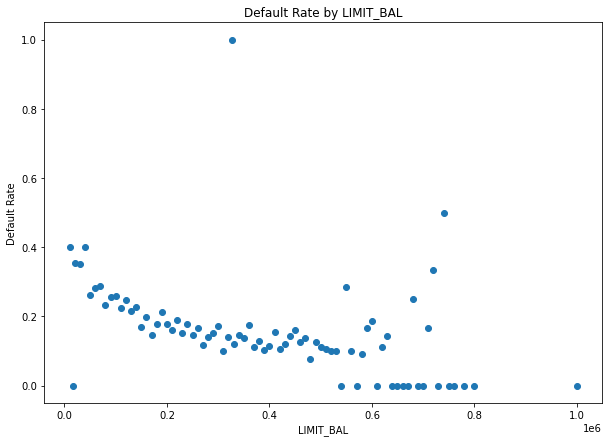

In [40]:
limit_Exite_rate = default.groupby(default['LIMIT_BAL'])['default.payment.next.month'].mean()
plt.figure(figsize = (10,7))
plt.scatter(x=limit_Exite_rate.index , y= limit_Exite_rate.values,marker = 'o',)
plt.title('Default Rate by LIMIT_BAL')
plt.xlabel('LIMIT_BAL')
plt.ylabel('Default Rate')
plt.show();

### Correlation

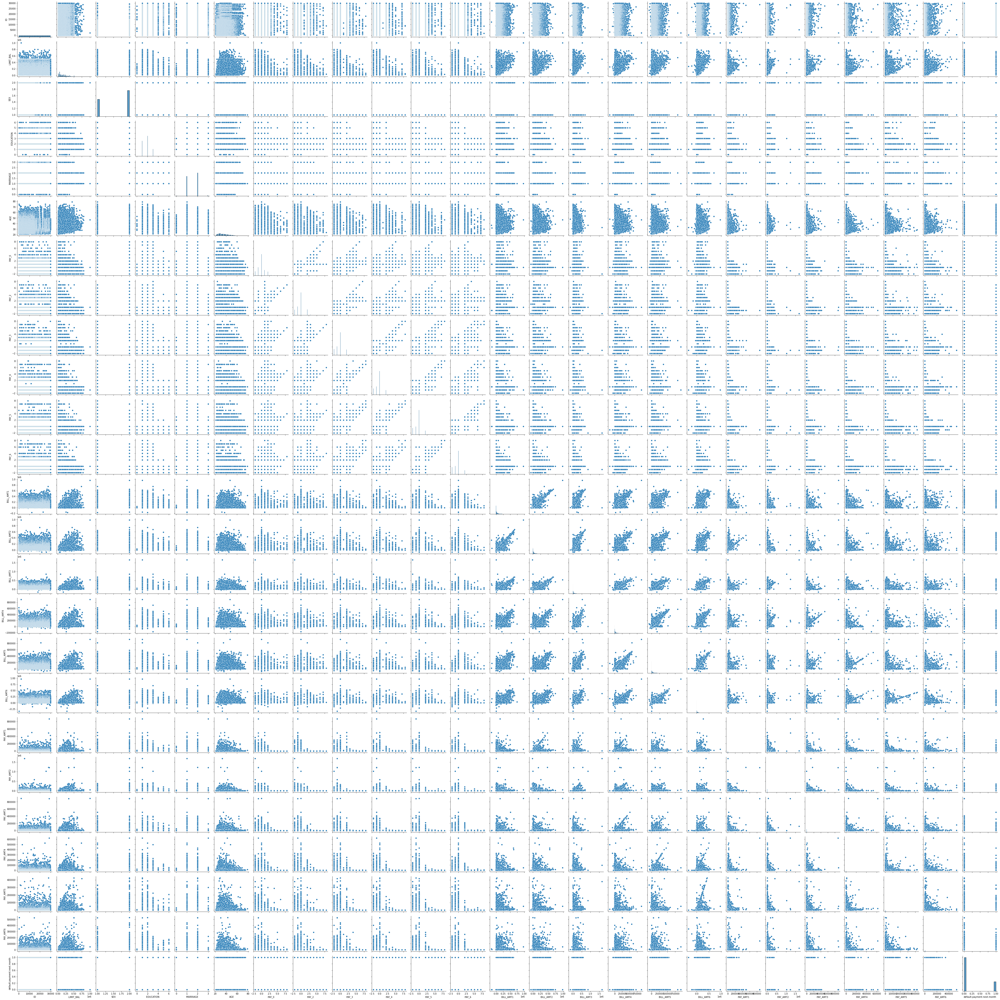

In [41]:
sns.pairplot(default);

### Default Customers Comparasion

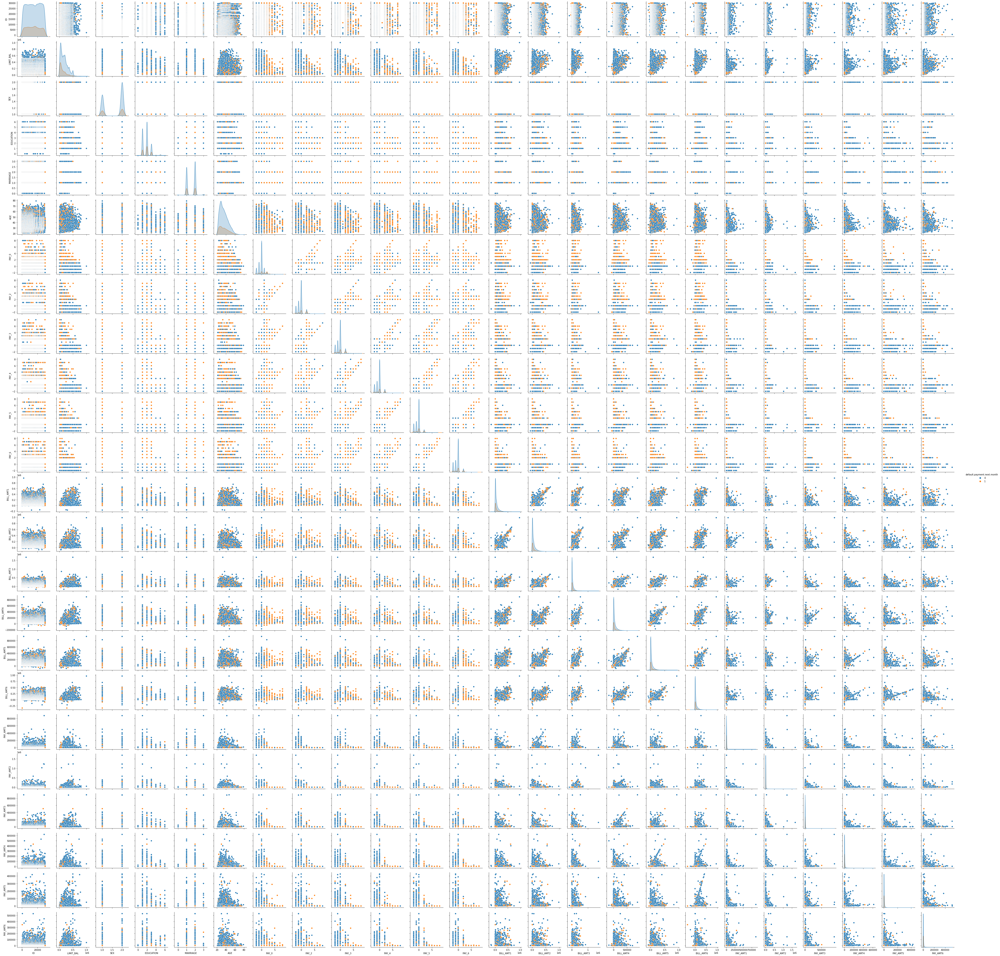

In [42]:
sns.pairplot(default, hue = 'default.payment.next.month');

## Feature Engineering

In [43]:
default['limit/age'] =default.apply(lambda x: x['LIMIT_BAL'] / x['AGE'] if x['AGE'] != 0 else 0, axis = 1)

### Feature Selection

In [44]:
default = default.drop(['ID'], axis = 1)

In [45]:
default.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month,limit/age
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1,833.333333
1,120000.0,2,2,2,26,-1,2,0,0,0,...,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1,4615.384615
2,90000.0,2,2,2,34,0,0,0,0,0,...,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0,2647.058824
3,50000.0,2,2,1,37,0,0,0,0,0,...,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0,1351.351351
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0,877.192982


In [46]:
default.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month', 'limit/age'],
      dtype='object')

In [47]:
features = default.drop(['default.payment.next.month'], axis = 1)

In [48]:
X = features
y = default['default.payment.next.month']

## Preprocessing

In [49]:
X_train_imb, X_test, y_train_imb, y_test = train_test_split(X, y, train_size = .8, 
                                                                random_state = 42, stratify = y)

In [50]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)

X_train, y_train = sm.fit_resample(X_train_imb, y_train_imb)

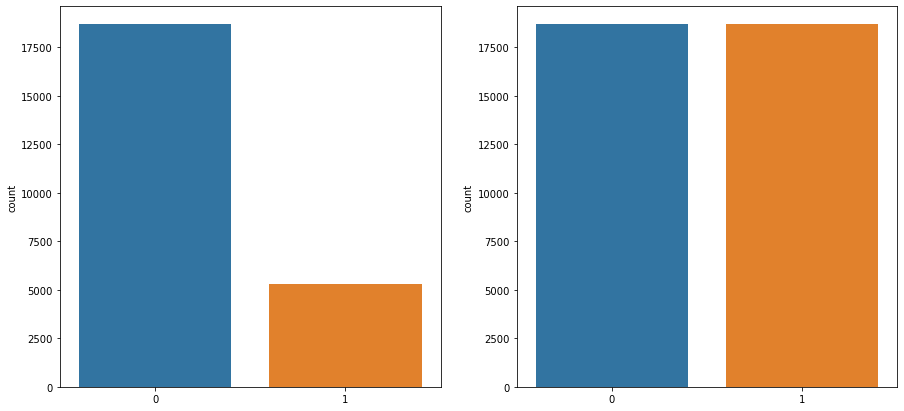

In [51]:
# Verify the imbalance data
fig, axis  = plt.subplots(1,2, figsize = (15,7));
sns.countplot(x= y_train_imb.values, ax = axis[0]);
sns.countplot(x= y_train.values, ax = axis[1]);

In [52]:
scaler = StandardScaler()

scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [53]:
X_train_scaled.shape, X_test_scaled.shape, y_train.shape, y_test.shape

((37382, 24), (6000, 24), (37382,), (6000,))

## ML

### Baseline Model

In [54]:
models = []
models.append(('Logistic Regression', LogisticRegression(solver='liblinear', random_state=42,
                                                         class_weight='balanced')))
models.append(('Random Forest', RandomForestClassifier(
    n_estimators=100, random_state=42)))
models.append(('SVM', SVC(gamma='auto', random_state=42)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('Decision Tree Classifier',
               DecisionTreeClassifier(random_state=42)))
models.append(('Gaussian NB', GaussianNB()))
models.append(('XGB Classifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss')))

In [55]:
acc_results = []
f1_results = []
recall_results = []
names = []
# set table to table to store performance results
col = ['Algorithm', 'F1 Mean', 'F1 STD', 
       'Accuracy Mean', 'Accuracy STD','Recall Mean', 'Recall STD']
df_results = pd.DataFrame(columns=col)
i = 0
# evaluate each model using cross-validation
for name, model in models:
    kfold = model_selection.KFold(
        n_splits=10, random_state=42, shuffle=True)  # 10-fold cross-validation

    cv_acc_results = model_selection.cross_val_score(  # accuracy scoring
        model, X_train_scaled, y_train, cv=kfold, scoring='accuracy')

    cv_f1_results = model_selection.cross_val_score(  # f1 scoring
        model, X_train_scaled, y_train, cv=kfold, scoring='f1')
    
    cv_recall_results = model_selection.cross_val_score(  # recall scoring
    model, X_train_scaled, y_train, cv=kfold, scoring='recall')

    acc_results.append(cv_acc_results)
    f1_results.append(cv_f1_results)
    recall_results.append(cv_recall_results)
    names.append(name)
    df_results.loc[i] = [name,
                         round(cv_f1_results.mean()*100, 2),
                         round(cv_f1_results.std()*100, 2),
                         round(cv_acc_results.mean()*100, 2),
                         round(cv_acc_results.std()*100, 2),
                         round(cv_recall_results.mean()*100, 2),
                         round(cv_recall_results.std()*100, 2)
                         ]
    i += 1
df_results.sort_values(by=['F1 Mean'], ascending=False)

,Algorithm,F1 Mean,F1 STD,Accuracy Mean,Accuracy STD,Recall Mean,Recall STD
1,Random Forest,85.16,0.73,85.39,0.71,83.85,0.89
6,XGB Classifier,82.56,0.71,83.01,0.65,80.44,0.98
3,KNN,77.17,0.61,76.51,0.60,79.42,0.77
4,Decision Tree Classifier,76.50,0.63,76.08,0.64,77.87,0.73
2,SVM,75.96,0.78,76.71,0.59,73.62,1.14
0,Logistic Regression,72.42,0.63,72.36,0.51,72.57,0.97
5,Gaussian NB,69.45,0.79,61.61,0.94,87.30,1.05


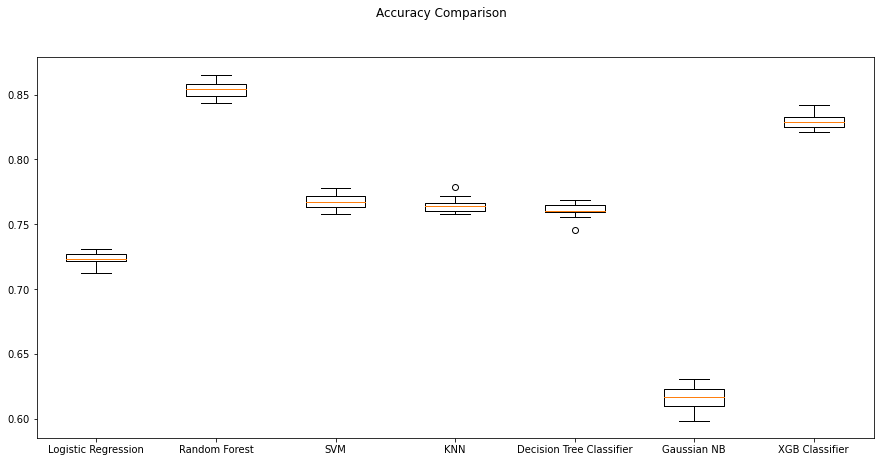

In [56]:
fig = plt.figure(figsize=(15, 7))
fig.suptitle('Accuracy Comparison')
ax = fig.add_subplot(111)
plt.boxplot(acc_results)
ax.set_xticklabels(names)
plt.show()

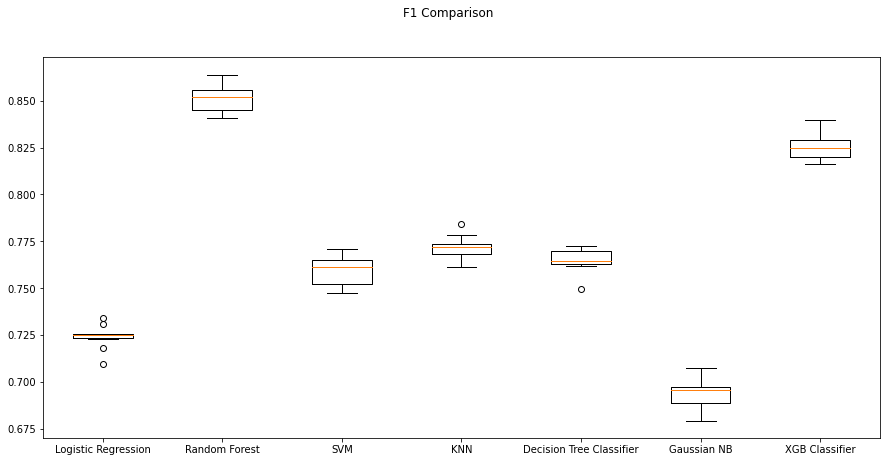

In [57]:
fig = plt.figure(figsize=(15, 7))
fig.suptitle('F1 Comparison')
ax = fig.add_subplot(111)
plt.boxplot(f1_results)
ax.set_xticklabels(names)
plt.show()

### Random Forest Classifier
- Random Forest has the highest performance
- In this case, Random Forest is selected as the training algorithm

In [58]:
kfold = model_selection.KFold(n_splits=10, random_state=42, shuffle=True)
model = RandomForestClassifier(n_estimators=100, random_state=42)
scoring = 'f1'
results = model_selection.cross_val_score(
    model, X_train_scaled, y_train, cv=kfold, scoring=scoring)
print("f1 score (STD): %.2f (%.2f)" % (results.mean(), results.std()))

f1 score (STD): 0.85 (0.01)


### Hyperparameter tunning

In [59]:
rf_classifier = RandomForestClassifier(class_weight = "balanced",
                                       random_state=42)
param_grid = {'n_estimators': [25, 50, 75, 100, 125, 150],
              'criterion':['gini','entropy'],
              'min_samples_split':[2,4,6],
              'min_samples_leaf': [1, 2]}

grid_obj = GridSearchCV(rf_classifier,
                        return_train_score=True,
                        param_grid=param_grid,
                        scoring='f1',
                        cv=5)

grid_fit = grid_obj.fit(X_train_scaled, y_train)
rf_opt = grid_fit.best_estimator_

print('='*100)
print("best params: " + str(grid_obj.best_estimator_))
print("best params: " + str(grid_obj.best_params_))
print('best score:', grid_obj.best_score_)
print('='*100)

best params: RandomForestClassifier(class_weight='balanced', n_estimators=125,
                       random_state=42)
best params: {'criterion': 'gini', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 125}
best score: 0.8361129532132487


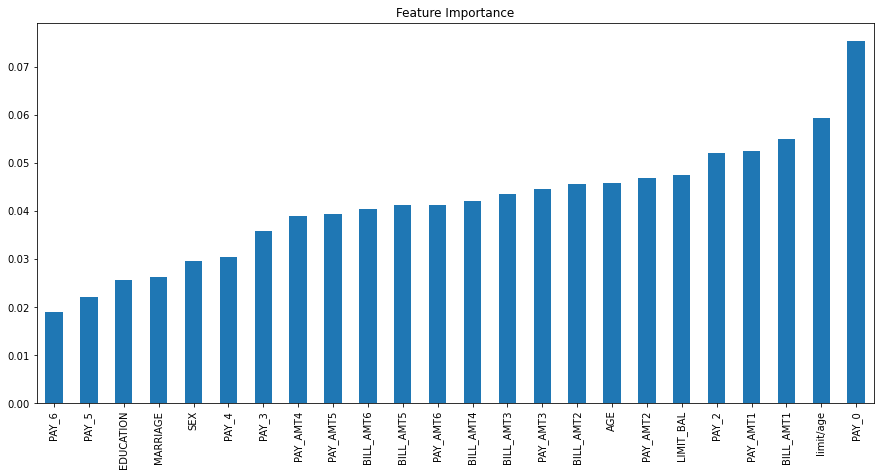

In [60]:
pd.Series(rf_opt.feature_importances_, index=X.columns).sort_values().plot(kind='bar',figsize=(15, 7))
plt.title("Feature Importance");

In [61]:
importances = rf_opt.feature_importances_
df_param_coeff = pd.DataFrame(columns=['Feature', 'Coefficient'])
for i in range(21):
    feat = X_train.columns[i]
    coeff = importances[i]
    df_param_coeff.loc[i] = (feat, coeff)
df_param_coeff.sort_values(by='Coefficient', ascending=False, inplace=True)
df_param_coeff = df_param_coeff.reset_index(drop=True)
df_param_coeff.head(15)

,Feature,Coefficient
0,PAY_0,0.075346
1,BILL_AMT1,0.054965
2,PAY_AMT1,0.052415
3,PAY_2,0.051958
4,LIMIT_BAL,0.047369
5,PAY_AMT2,0.046896
6,AGE,0.045763
7,BILL_AMT2,0.045662
8,PAY_AMT3,0.044563
9,BILL_AMT3,0.043436


In [62]:
# Classification report for the optimised algorithm
rf_opt.fit(X_train_scaled, y_train)
print(classification_report(y_test, rf_opt.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.86      0.87      0.86      4673
           1       0.51      0.49      0.50      1327

    accuracy                           0.78      6000
   macro avg       0.68      0.68      0.68      6000
weighted avg       0.78      0.78      0.78      6000



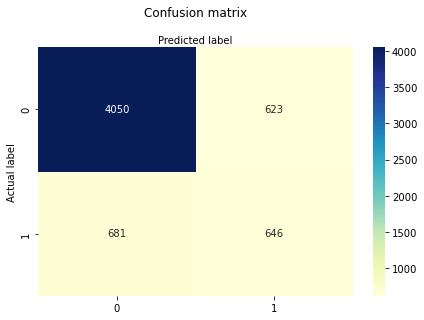

In [65]:
## Confusion Matrix
cnf_matrix = metrics.confusion_matrix(y_test, rf_opt.predict(X_test_scaled))
class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)
# create heatmap
sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")
plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label');

### Model Stacking

In [66]:
estimators = [
    ('XGB Classifier', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
    ('Random Forest', rf_opt),
    ('SVM', SVC(gamma='auto', random_state=42)),
    ('KNN', KNeighborsClassifier()),
    ('Decision Tree Classifier',DecisionTreeClassifier(random_state=42))
]

clf = StackingClassifier(
    estimators=estimators, final_estimator= LogisticRegression(solver='liblinear', random_state=42, C=10,
                                                         class_weight='balanced')
)

clf.fit(X_train_scaled, y_train)


clf.score(X_test_scaled, y_test)

0.7791666666666667

In [68]:
print(classification_report(y_test, clf.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86      4673
           1       0.50      0.45      0.48      1327

    accuracy                           0.78      6000
   macro avg       0.67      0.66      0.67      6000
weighted avg       0.77      0.78      0.78      6000



### Deep Learning

In [69]:
model = MLPClassifier(hidden_layer_sizes = (20, 20), activation ='relu', 
                      solver = 'adam', max_iter = 50)
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

print("Training Accuracy :", model.score(X_train_scaled, y_train))
print("Testing Accuracy :", model.score(X_test_scaled, y_test))

cm = confusion_matrix(y_test, y_pred)
print(cm)

Training Accuracy : 0.7791182922262051
Testing Accuracy : 0.7551666666666667
[[3831  842]
 [ 627  700]]


/Users/mario/opt/anaconda3/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


## Deployment

In [67]:
# filename = 'final_model.model'
# i = [rf_opt]
# joblib.dump(i,filename)